In [1]:
import csv
import pandas as pd
import matplotlib.pyplot as plt

# Total License Count Data

In [2]:
df = pd.read_csv('license_counts.csv')
df.head()

,cc-by,cc-by-sa,cc-by-nd,cc-by-nc,cc-by-nc-sa,cc-by-nc-nd
0,12717,2614,552,6352,20320,4438


([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'cc-by'),
  Text(1, 0, 'cc-by-sa'),
  Text(2, 0, 'cc-by-nd'),
  Text(3, 0, 'cc-by-nc'),
  Text(4, 0, 'cc-by-nc-sa'),
  Text(5, 0, 'cc-by-nc-nd')])

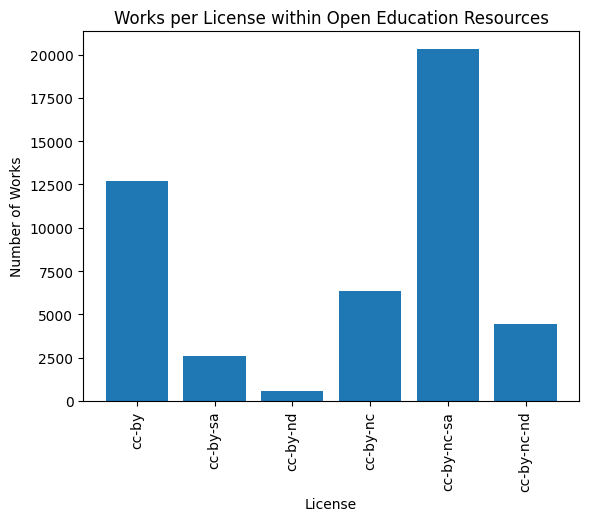

In [3]:
plt.bar(df.columns, df.iloc[0])
plt.title("Works per License within Open Education Resources")
plt.xlabel("License")
plt.ylabel("Number of Works")
plt.xticks(rotation=90)

# Licensed Works Data

In [4]:
oer_df = pd.read_csv("oer.csv", delimiter='\t')

In [5]:
oer_df = oer_df.rename(columns={"Education Level": "education_level", "Subject Area": "subject_area", "Material Type": "material_type", "Media Format": "media_format", "Primary User": "primary_user", "Educational Use": "educational_use"})

In [6]:
oer_df.sample(20)

,id,license,modification_date,education_level,subject_area,material_type,media_format,Languages,primary_user,educational_use
25398,274242,cc-by-nc-sa,2023-03-10,"high-school,community-college-lower-division",economics,lesson,video,en,student,curriculum-instruction
22984,284400,cc-by-nc-sa,2023-03-14,college-upper-division,biology,activity-lab,text-html,en,teacher,curriculum-instruction
45446,269084,cc-by-nc-nd,2023-03-11,college-upper-division,communication,diagram-illustration,NaN,en,NaN,NaN
1067,88322,cc-by,2021-11-24,upper-primary,"composition-and-rhetoric,reading-literature,sp...",activity-lab,"text-html,video",en,teacher,curriculum-instruction
35329,58615,cc-by-nc-sa,2023-03-13,upper-primary,hydrology,activity-lab,text-html,en,teacher,NaN
14765,265749,cc-by-sa,2023-03-13,"community-college-lower-division,college-upper...",statistics-and-probability,textbook,"downloadable-docs,text-html",en,NaN,NaN
41455,145747,cc-by-nc-sa,2023-03-16,"community-college-lower-division,college-upper...","life-science,zoology",reading,text-html,en,NaN,NaN
6125,66953,cc-by,2020-05-18,"lower-primary,upper-primary,middle-school,high...",educational-technology,teaching-learning-strategy,NaN,en,NaN,NaN
38624,58527,cc-by-nc-sa,2023-03-13,upper-primary,"environmental-science,hydrology",activity-lab,text-html,en,teacher,NaN
23697,19266,cc-by-nc-sa,2016-12-31,college-upper-division,life-science,diagram-illustration,"graphics-photos,text-html",en,teacher,curriculum-instruction


In [7]:
oer_df['modification_date'] = oer_df['modification_date'].apply(pd.to_datetime)

In [8]:
oer_df_byeducation = oer_df.dropna(subset=['education_level'])
oer_df_byeducation['education_level_explode'] = oer_df_byeducation['education_level'].apply(lambda x: x.split(','))
oer_df_byeducation = oer_df_byeducation.explode('education_level_explode')
oer_df_byeducation

/var/folders/68/v3_3qddj09l6lll90glttwsm0000gq/T/ipykernel_51322/385767326.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  oer_df_byeducation['education_level_explode'] = oer_df_byeducation['education_level'].apply(lambda x: x.split(','))


,id,license,modification_date,education_level,subject_area,material_type,media_format,Languages,primary_user,educational_use,education_level_explode
0,86509,cc-by,2023-02-01,"middle-school,high-school",u-s-history,lesson-plan,"downloadable-docs,video",en,teacher,curriculum-instruction,middle-school
0,86509,cc-by,2023-02-01,"middle-school,high-school",u-s-history,lesson-plan,"downloadable-docs,video",en,teacher,curriculum-instruction,high-school
1,88278,cc-by,2021-11-23,lower-primary,mathematics,activity-lab,NaN,en,NaN,NaN,lower-primary
2,73381,cc-by,2020-10-14,lower-primary,mathematics,interactive,NaN,en,NaN,NaN,lower-primary
3,6153,cc-by,2019-08-08,"upper-primary,high-school",mathematics,"activity-lab,lesson-plan,teaching-learning-str...",text-html,en,teacher,professional-development,upper-primary
...,...,...,...,...,...,...,...,...,...,...,...
46947,10704,cc-by-nc-nd,2016-10-25,high-school,business-and-communication,lesson-plan,NaN,en,"student,teacher",NaN,high-school
46948,13068,cc-by-nc-nd,2017-06-17,college-upper-division,education,module,text-html,it,"student,teacher",curriculum-instruction,college-upper-division
46949,23649,cc-by-nc-nd,2018-05-26,graduate-professional,health-medicine-and-nursing,module,ebook,en,"student,teacher",professional-development,graduate-professional
46951,46255,cc-by-nc-nd,2018-07-03,"graduate-professional,adult-education","applied-science,arts-and-humanities,life-scien...","diagram-illustration,full-course,game,interact...","text-html,video",en,student,"curriculum-instruction,professional-developmen...",graduate-professional


In [9]:
# Expand columns
new_columns = {
    "education_level": [],
    "subject_area": [],
    "material_type": [],
    "media_format": [],
    "Languages": [],
    "primary_user": [],
    "educational_use": []
}
new_columns

{'education_level': [],
 'subject_area': [],
 'material_type': [],
 'media_format': [],
 'Languages': [],
 'primary_user': [],
 'educational_use': []}

In [10]:
def get_unique_values(column):
    lst = oer_df[column].unique()
    set_items = set()
    # Get unique values
    for item in lst:
        split = str(item).split(",")
        for value in split:
            set_items.add(value)
    # Create new columns
    for item in set_items:
        oer_df[f'{column}_{item}'] = False
        new_columns[column].append(f'{column}_{item}')
    # return set_items

for key in new_columns:
    get_unique_values(key)

new_columns

/var/folders/68/v3_3qddj09l6lll90glttwsm0000gq/T/ipykernel_51322/484203485.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  oer_df[f'{column}_{item}'] = False
/var/folders/68/v3_3qddj09l6lll90glttwsm0000gq/T/ipykernel_51322/484203485.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  oer_df[f'{column}_{item}'] = False
/var/folders/68/v3_3qddj09l6lll90glttwsm0000gq/T/ipykernel_51322/484203485.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which ha

{'education_level': ['education_level_college-upper-division',
  'education_level_high-school',
  'education_level_preschool',
  'education_level_adult-education',
  'education_level_upper-primary',
  'education_level_middle-school',
  'education_level_community-college-lower-division',
  'education_level_graduate-professional',
  'education_level_career-technical',
  'education_level_lower-primary',
  'education_level_nan'],
 'subject_area': ['subject_area_social-science',
  'subject_area_reading-foundation-skills',
  'subject_area_ratios-and-proportions',
  'subject_area_maritime-science',
  'subject_area_world-history',
  'subject_area_political-science',
  'subject_area_genetics',
  'subject_area_graphic-design',
  'subject_area_general-law',
  'subject_area_mathematics',
  'subject_area_botany',
  'subject_area_health-medicine-and-nursing',
  'subject_area_algebra',
  'subject_area_art-history',
  'subject_area_journalism',
  'subject_area_automotive-technology-and-repair',
  'sub

In [11]:
oer_df.head()

,id,license,modification_date,education_level,subject_area,material_type,media_format,Languages,primary_user,educational_use,...,primary_user_other,primary_user_librarian,primary_user_administrator,primary_user_nan,educational_use_curriculum-instruction,educational_use_other,educational_use_assessment,educational_use_informal-education,educational_use_professional-development,educational_use_nan
0,86509,cc-by,2023-02-01,"middle-school,high-school",u-s-history,lesson-plan,"downloadable-docs,video",en,teacher,curriculum-instruction,...,False,False,False,False,False,False,False,False,False,False
1,88278,cc-by,2021-11-23,lower-primary,mathematics,activity-lab,NaN,en,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
2,73381,cc-by,2020-10-14,lower-primary,mathematics,interactive,NaN,en,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
3,6153,cc-by,2019-08-08,"upper-primary,high-school",mathematics,"activity-lab,lesson-plan,teaching-learning-str...",text-html,en,teacher,professional-development,...,False,False,False,False,False,False,False,False,False,False
4,8397,cc-by,2016-01-28,high-school,life-science,full-course,"downloadable-docs,text-html",en,"student,teacher",curriculum-instruction,...,False,False,False,False,False,False,False,False,False,False


In [44]:
def expand_columns(row):
    for key in new_columns:
        split = str(row[key]).split(",")
        for item in split:
            row[f'{key}_{item}'] = True
    return row

In [49]:
oer_df = oer_df.apply(expand_columns, axis=1)

education_level
['middle-school', 'high-school']
education_level_middle-school
education_level_high-school
subject_area
['u-s-history']
subject_area_u-s-history
material_type
['lesson-plan']
material_type_lesson-plan
media_format
['downloadable-docs', 'video']
media_format_downloadable-docs
media_format_video
Languages
['en']
Languages_en
primary_user
['teacher']
primary_user_teacher
educational_use
['curriculum-instruction']
educational_use_curriculum-instruction
education_level
['lower-primary']
education_level_lower-primary
subject_area
['mathematics']
subject_area_mathematics
material_type
['activity-lab']
material_type_activity-lab
media_format
['nan']
media_format_nan
Languages
['en']
Languages_en
primary_user
['nan']
primary_user_nan
educational_use
['nan']
educational_use_nan
education_level
['lower-primary']
education_level_lower-primary
subject_area
['mathematics']
subject_area_mathematics
material_type
['interactive']
material_type_interactive
media_format
['nan']
media_form

KeyboardInterrupt: 